In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


season_21 = pd.read_csv('data/TBR Capstone Data/pitches_21.csv')
season_22 = pd.read_csv('data/TBR Capstone Data/pitches_22.csv')
season_23 = pd.read_csv('data/TBR Capstone Data/pitches_23.csv')
all_seasons = pd.concat([season_21, season_22, season_23], ignore_index=True)

In [2]:
all_seasons['GameDate'] = pd.to_datetime(all_seasons['GameDate'])
all_seasons['Date'] = all_seasons['GameDate'].dt.date
season_21['Time'] = all_seasons['GameDate'].dt.time

cols = list(all_seasons.columns)
# find index of GameDate
idx = cols.index('GameDate')
# Basically put Date and Time right next to GameDate 
new_cols = cols[:idx + 1] + ['Date', 'Time'] + cols[idx + 1:-2]

In [3]:
all_seasons  = all_seasons.sort_values(by = ['Date', 'Home', 'ab'])
#all_seasons = all_seasons.drop(columns = ['Unnamed: 0'])
all_seasons
#all_seasons.to_csv("all_seasons.csv")

,gameid,GameDate,ab,pitchnum,inning,teambat,balls,strikes,outs,pitcher,...,inducedvertbreak,platelocside,platelocheight,hometeam_id,Home,awayteam_id,Visitor,venue_id,venue_name,Date
104858,2021/04/01/pitmlb-chnmlb-1,2021-04-01 13:20:00,1,1,1.0,0,0.0,0.0,0.0,"Hendricks, Kyle",...,20.196724,-0.925614,3.118610,112,Chicago Cubs,134,Pittsburgh Pirates,17,Wrigley Field,2021-04-01
104859,2021/04/01/pitmlb-chnmlb-1,2021-04-01 13:20:00,1,2,1.0,0,1.0,0.0,0.0,"Hendricks, Kyle",...,20.294086,-0.000916,1.945728,112,Chicago Cubs,134,Pittsburgh Pirates,17,Wrigley Field,2021-04-01
104860,2021/04/01/pitmlb-chnmlb-1,2021-04-01 13:20:00,1,3,1.0,0,1.0,1.0,0.0,"Hendricks, Kyle",...,18.184725,-1.969467,3.548406,112,Chicago Cubs,134,Pittsburgh Pirates,17,Wrigley Field,2021-04-01
104861,2021/04/01/pitmlb-chnmlb-1,2021-04-01 13:20:00,1,4,1.0,0,2.0,1.0,0.0,"Hendricks, Kyle",...,19.395239,-1.160865,2.435223,112,Chicago Cubs,134,Pittsburgh Pirates,17,Wrigley Field,2021-04-01
104862,2021/04/01/pitmlb-chnmlb-1,2021-04-01 13:20:00,1,5,1.0,0,3.0,1.0,0.0,"Hendricks, Kyle",...,17.362413,0.046086,2.654030,112,Chicago Cubs,134,Pittsburgh Pirates,17,Wrigley Field,2021-04-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2047122,2023/09/28/miamlb-nynmlb-1,2023-10-02 17:10:00,67,2,NaN,1,NaN,NaN,NaN,NaN,...,16.845800,-0.149840,3.708887,121,New York Mets,146,Miami Marlins,3289,Citi Field,2023-10-02
2047123,2023/09/28/miamlb-nynmlb-1,2023-10-02 17:10:00,68,1,NaN,1,NaN,NaN,NaN,NaN,...,10.574021,-1.381323,2.591258,121,New York Mets,146,Miami Marlins,3289,Citi Field,2023-10-02
2047360,2023/09/28/miamlb-nynmlb-1,2023-10-02 17:10:00,68,2,NaN,1,NaN,NaN,NaN,NaN,...,-1.425607,0.139988,2.687900,121,New York Mets,146,Miami Marlins,3289,Citi Field,2023-10-02
2047361,2023/09/28/miamlb-nynmlb-1,2023-10-02 17:10:00,68,3,NaN,1,NaN,NaN,NaN,NaN,...,-0.707107,1.429425,0.572016,121,New York Mets,146,Miami Marlins,3289,Citi Field,2023-10-02


In [4]:
original_length = len(all_seasons)

df_cleaned = all_seasons.dropna()
cleaned_length = len(df_cleaned)
rows_dropped = original_length - cleaned_length
print(f'Number of rows dropped: {rows_dropped}')



Number of rows dropped: 4677


In [5]:
# Defining the event types
strikeout_events = ["strikeout", "strikeout_double_play"]
fieldout_events = ["field_out", "grounded_into_double_play", "force_out", "fielders_choice_out", 
                   "fielders_choice", "double_play", "sac_fly", "sac_bunt", "sac_fly_double_play", "triple_play"]
complements = ["ball", "single", "blocked_ball", "foul", "walk", "force_out", "wild_pitch", "stolen_base_2b", 
               "homerun", "hit_by_pitch", "double", "triple", "field_error", "stolen_base_3b", "passed_ball", 
               "caught_stealing_2b", "defensive_indiff", "caught_stealing_3b", "pitchout", 
               "swinging_strike_blocked", "swinging_strike", "pickoff_caught_stealing_2b", "missed_bunt", 
               "caught_stealing_home", "other_advance", "called_strike", "stolen_base_home"]
hit = ["single", "homerun", "double", "triple"]


In [6]:
# Filter the data for strikeout and fieldout events
strikeout_df = df_cleaned[df_cleaned['eventtype'].isin(strikeout_events)]
fieldout_df = df_cleaned[df_cleaned['eventtype'].isin(fieldout_events)]

In [7]:
# Use .loc to modify the DataFrame safely
strikeout_df.loc[:, 'is_strikeout'] = strikeout_df['eventtype'].apply(lambda x: 1 if x in strikeout_events else 0)


/var/folders/20/qddrh_4x19s0st17k9zrxd2m0000gn/T/ipykernel_33282/3710874357.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  strikeout_df.loc[:, 'is_strikeout'] = strikeout_df['eventtype'].apply(lambda x: 1 if x in strikeout_events else 0)


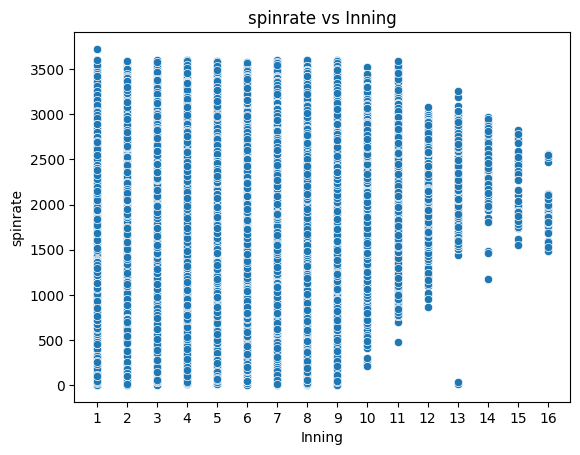

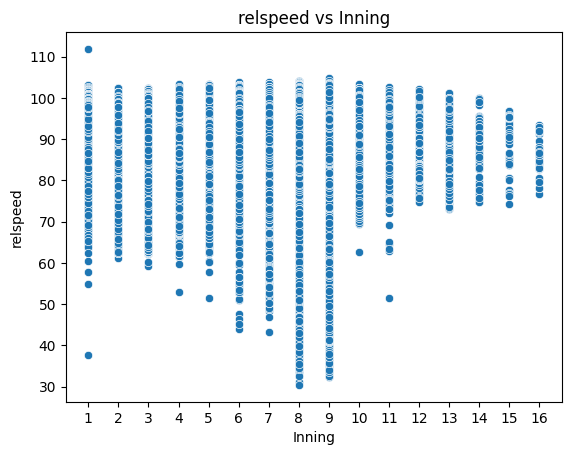

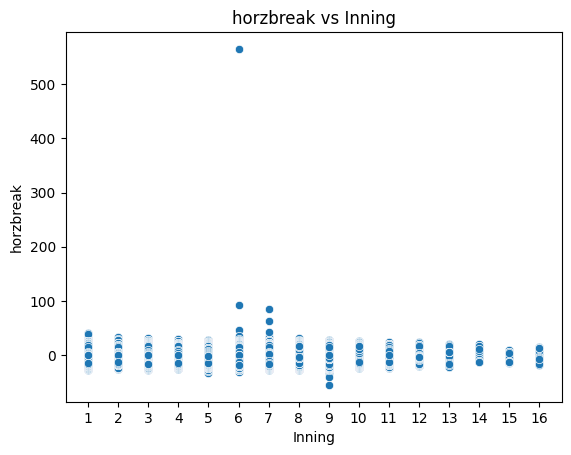

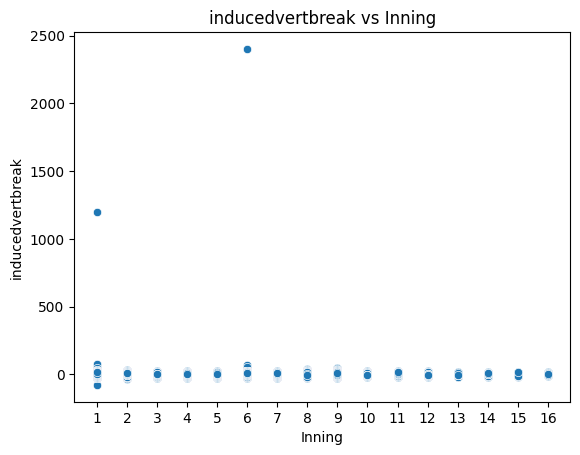

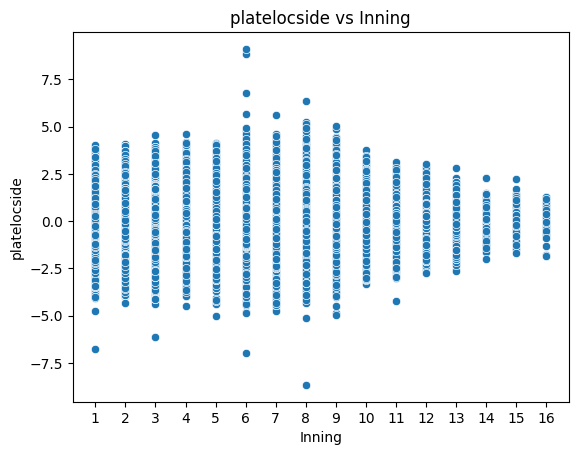

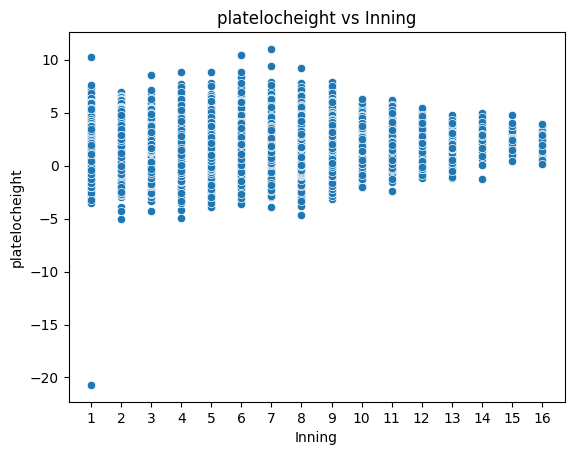

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of features to plot against innings
features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside','platelocheight']

# Set the range of innings for the x-axis
inning_min = int(all_seasons['inning'].min())
inning_max = int(all_seasons['inning'].max())
inning_range = list(range(inning_min, inning_max + 1))

# Loop through the features and create individual plots
for i, feature in enumerate(features):
    plt.figure(i)  # Create a new figure for each feature
    sns.scatterplot(x='inning', y=feature, data=all_seasons)
    
    # Set the x-axis ticks to go by 1 inning
    plt.xticks(inning_range)
    
    # Add titles and labels
    plt.title(f'{feature} vs Inning')
    plt.xlabel('Inning')
    plt.ylabel(feature)
    
    # Show the plot
    plt.show()


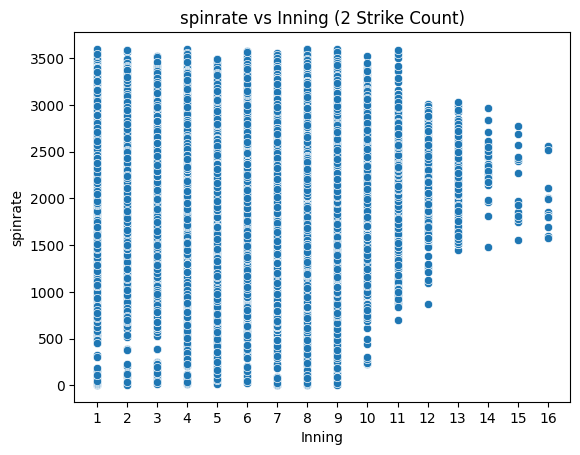

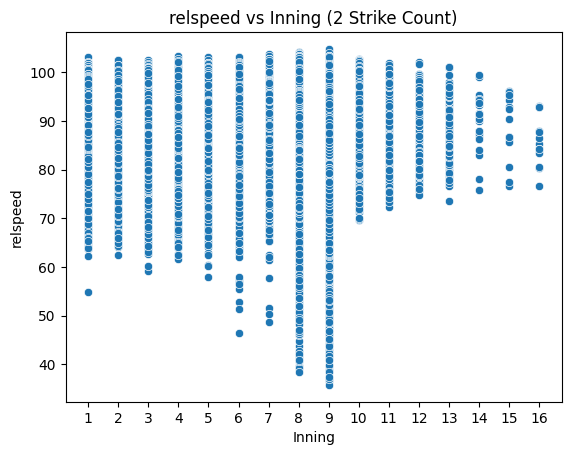

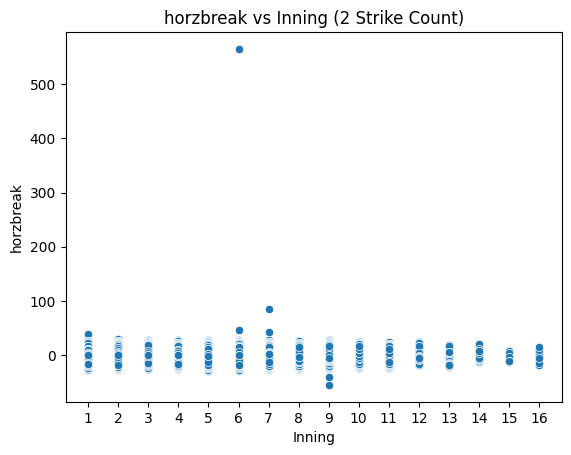

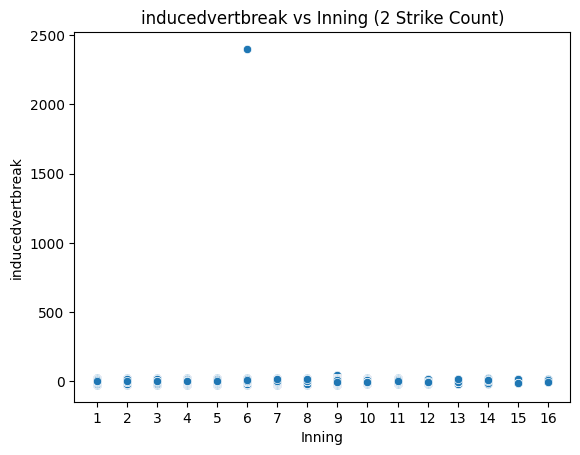

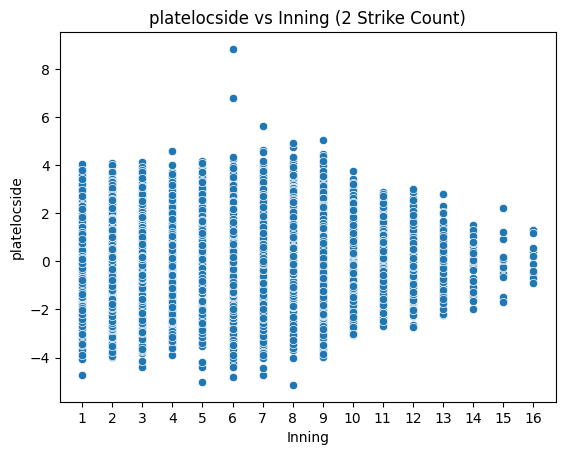

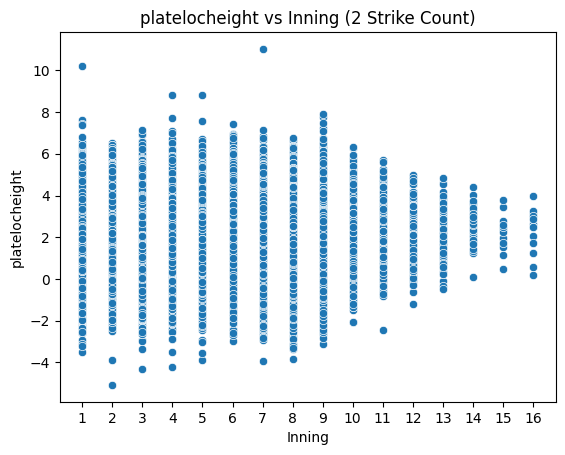

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data for rows where there are exactly 2 strikes
two_strike_df = all_seasons[all_seasons['strikes'] == 2]

# List of features to plot against innings
features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside','platelocheight']

# Set the range of innings for the x-axis
inning_min = int(two_strike_df['inning'].min())
inning_max = int(two_strike_df['inning'].max())
inning_range = list(range(inning_min, inning_max + 1))

# Loop through the features and create individual plots for 2-strike counts
for i, feature in enumerate(features):
    plt.figure(i)  # Create a new figure for each feature
    sns.scatterplot(x='inning', y=feature, data=two_strike_df)
    
    # Set the x-axis ticks to go by 1 inning
    plt.xticks(inning_range)
    
    # Add titles and labels
    plt.title(f'{feature} vs Inning (2 Strike Count)')
    plt.xlabel('Inning')
    plt.ylabel(feature)
    
    # Show the plot
    plt.show()


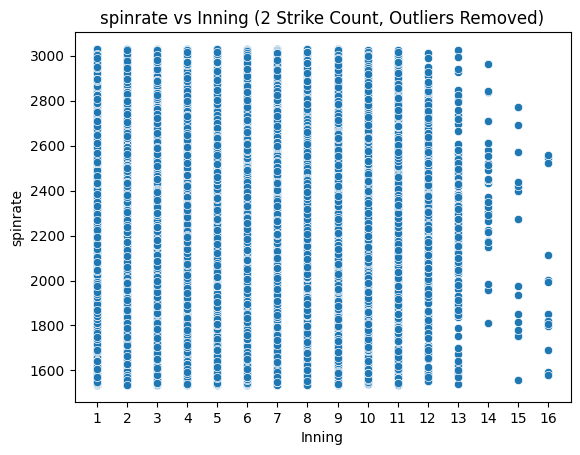

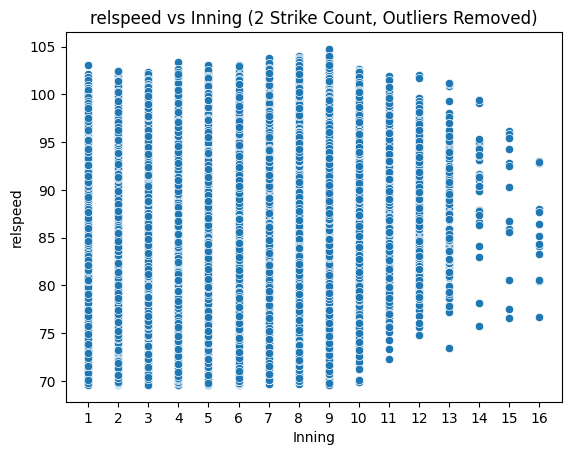

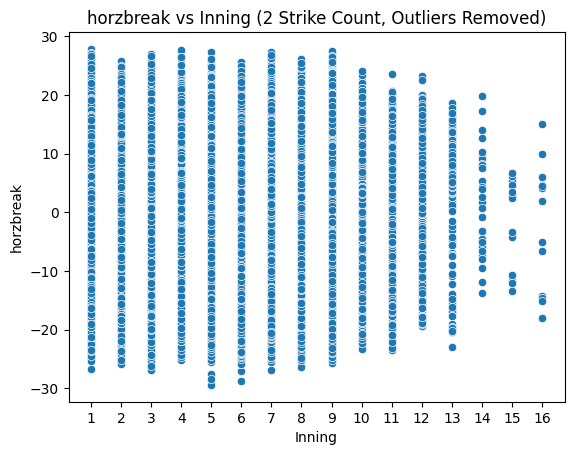

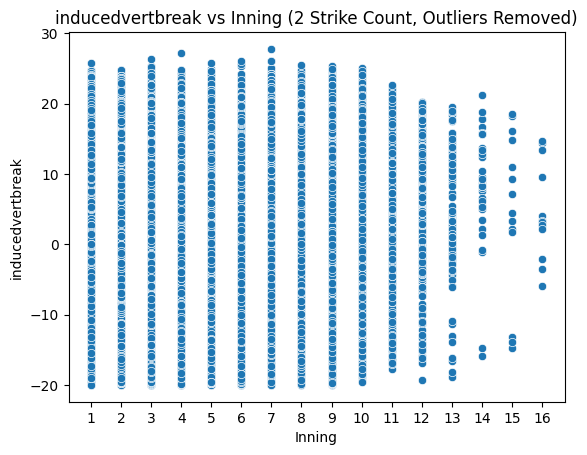

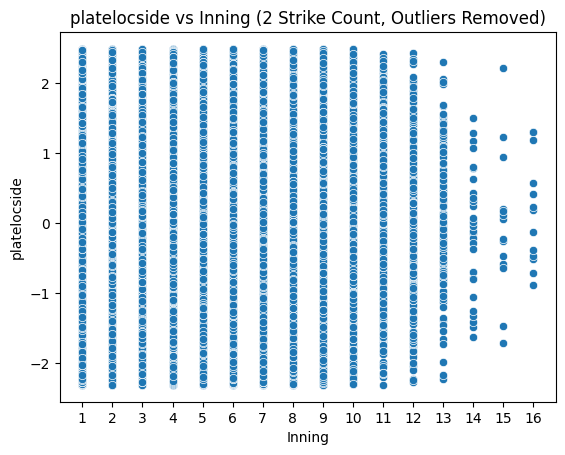

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Filter the data for rows where there are exactly 2 strikes
two_strike_df = all_seasons[all_seasons['strikes'] == 2]

# Function to remove outliers using the IQR method
def remove_outliers(df, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 - Q1
    # Filter for values within the lower and upper bounds
    df_outliers_removed = df[~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]
    return df_outliers_removed

# List of features to check for outliers and plot against innings
features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside']

# Remove outliers in the two-strike DataFrame
two_strike_df_cleaned = remove_outliers(two_strike_df, features)

# Set the range of innings for the x-axis
inning_min = int(two_strike_df_cleaned['inning'].min())
inning_max = int(two_strike_df_cleaned['inning'].max())
inning_range = list(range(inning_min, inning_max + 1))

# Loop through the features and create individual plots for 2-strike counts without outliers
for i, feature in enumerate(features):
    plt.figure(i)  # Create a new figure for each feature
    sns.scatterplot(x='inning', y=feature, data=two_strike_df_cleaned)
    
    # Set the x-axis ticks to go by 1 inning
    plt.xticks(inning_range)
    
    # Add titles and labels
    plt.title(f'{feature} vs Inning (2 Strike Count, Outliers Removed)')
    plt.xlabel('Inning')
    plt.ylabel(feature)
    
    # Show the plot
    plt.show()


/var/folders/20/qddrh_4x19s0st17k9zrxd2m0000gn/T/ipykernel_33282/3474333104.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  two_strike_df_cleaned['event_category'] = two_strike_df_cleaned['eventtype'].apply(categorize_event)


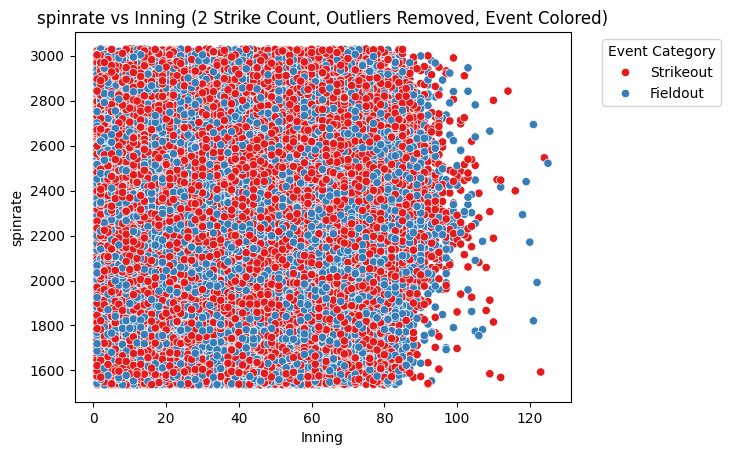

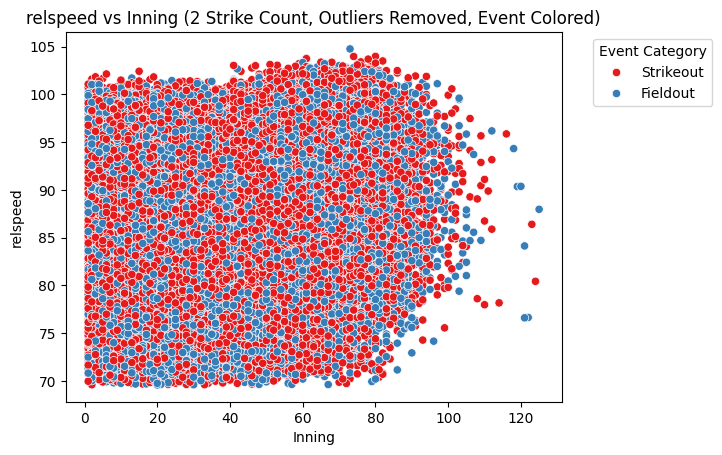

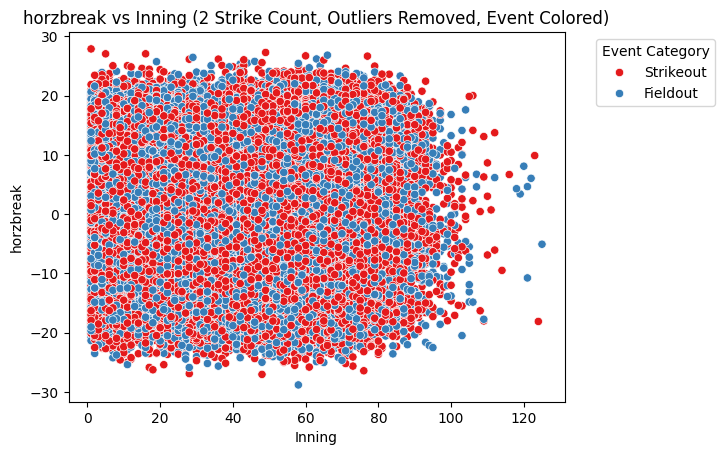

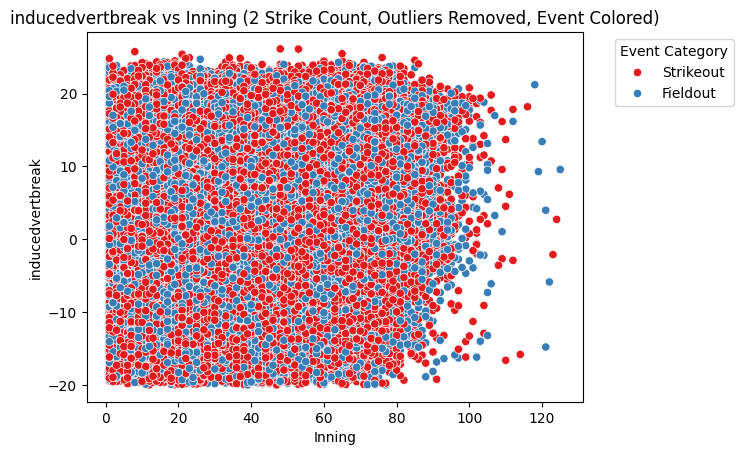

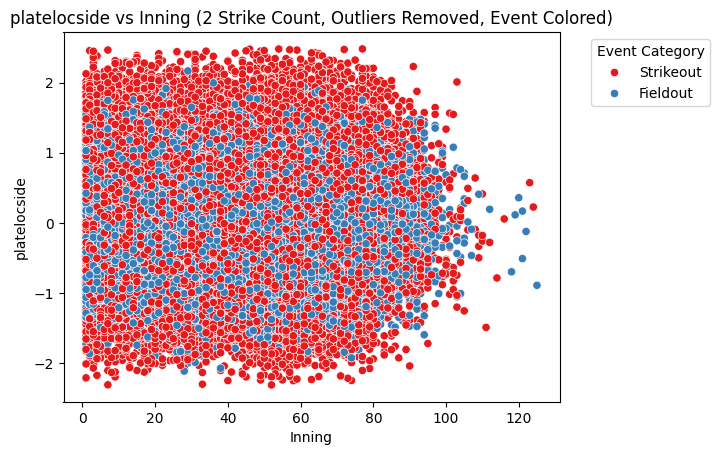

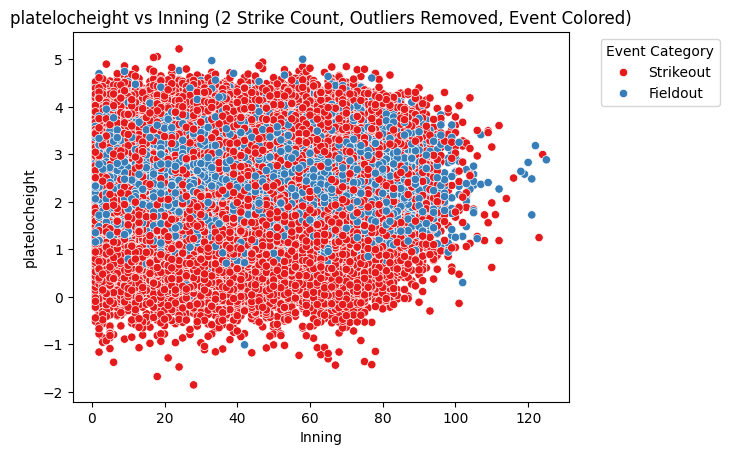

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data for rows where there are exactly 2 strikes
two_strike_df = all_seasons[all_seasons['strikes'] == 2 ]

# Function to remove outliers using the IQR method
def remove_outliers(df, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 - Q1
    # Filter for values within the lower and upper bounds
    df_outliers_removed = df[~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]
    return df_outliers_removed

# Remove outliers in the two-strike DataFrame
two_strike_df_cleaned = remove_outliers(two_strike_df, ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside'])

# Add a new column that categorizes the event types into different groups
def categorize_event(event):
    if event in strikeout_events:
        return 'Strikeout'
    elif event in fieldout_events:
        return 'Fieldout'
    #elif event in hit:
        #return 'Hit'

two_strike_df_cleaned['event_category'] = two_strike_df_cleaned['eventtype'].apply(categorize_event)

# Set the range of innings for the x-axis
inning_min = int(two_strike_df_cleaned['ab'].min())
inning_max = int(two_strike_df_cleaned['ab'].max())
inning_range = list(range(inning_min, inning_max + 1))

# List of features to plot against innings
features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside', 'platelocheight']

# Loop through the features and create individual plots for 2-strike counts without outliers, with different colors for event types
for i, feature in enumerate(features):
    plt.figure(i)  # Create a new figure for each feature
    sns.scatterplot(x='ab', y=feature, hue='event_category', palette='Set1', data=two_strike_df_cleaned)
    
    # Set the x-axis ticks to go by 1 inning
    #plt.xticks(inning_range)
    
    # Add titles and labels
    plt.title(f'{feature} vs Inning (2 Strike Count, Outliers Removed, Event Colored)')
    plt.xlabel('Inning')
    plt.ylabel(feature)
    
    # Show the plot
    plt.legend(title='Event Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data for rows where there are exactly 2 strikes and 3 balls
two_strike_three_ball_df = all_seasons[(all_seasons['strikes'] == 2) & (all_seasons['balls'] == 3)]

# Function to remove outliers using the IQR method
def remove_outliers(df, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 - Q1
    # Filter for values within the lower and upper bounds
    df_outliers_removed = df[~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]
    return df_outliers_removed

# Remove outliers in the filtered DataFrame
two_strike_three_ball_df_cleaned = remove_outliers(two_strike_three_ball_df, ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside'])

# Add a new column that categorizes the event types into different groups
def categorize_event(event):
    if event in strikeout_events:
        return 'Strikeout'
    elif event in fieldout_events:
        return 'Fieldout'
    elif event in hit:
        return 'Hit'
    else:
        return 'Complement'

two_strike_three_ball_df_cleaned['event_category'] = two_strike_three_ball_df_cleaned['eventtype'].apply(categorize_event)

# Set the range of innings for the x-axis
inning_min = int(two_strike_three_ball_df_cleaned['inning'].min())
inning_max = int(two_strike_three_ball_df_cleaned['inning'].max())
inning_range = list(range(inning_min, inning_max + 1))

# List of features to plot against innings
features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside']

# Loop through the features and create individual plots for 2-strike, 3-ball counts without outliers, with different colors for event types
for i, feature in enumerate(features):
    plt.figure(i)  # Create a new figure for each feature
    sns.scatterplot(x='inning', y=feature, hue='event_category', palette='Set1', data=two_strike_three_ball_df_cleaned)
    
    # Set the x-axis ticks to go by 1 inning
    plt.xticks(inning_range)
    
    # Add titles and labels
    plt.title(f'{feature} vs Inning (2 Strikes, 3 Balls, Outliers Removed, Event Colored)')
    plt.xlabel('Inning')
    plt.ylabel(feature)
    
    # Show the plot
    plt.legend(title='Event Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()


/var/folders/20/qddrh_4x19s0st17k9zrxd2m0000gn/T/ipykernel_33282/1475250926.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  two_strike_three_ball_df_cleaned['event_category'] = two_strike_three_ball_df_cleaned['eventtype'].apply(categorize_event)


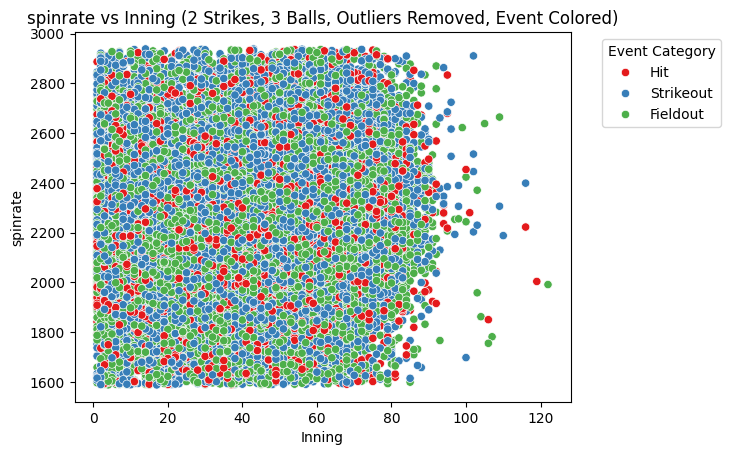

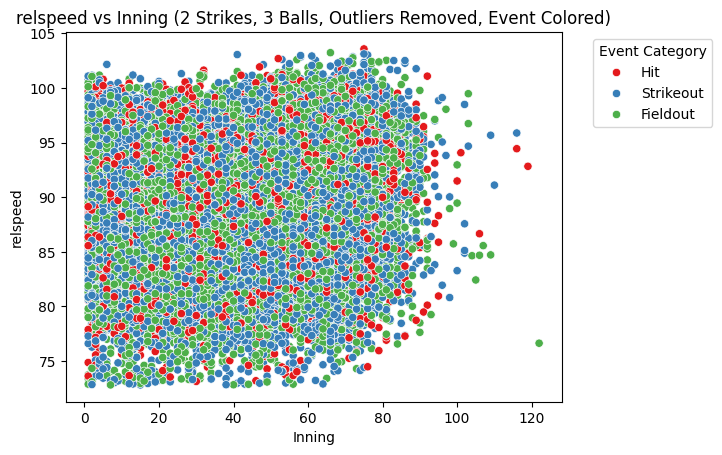

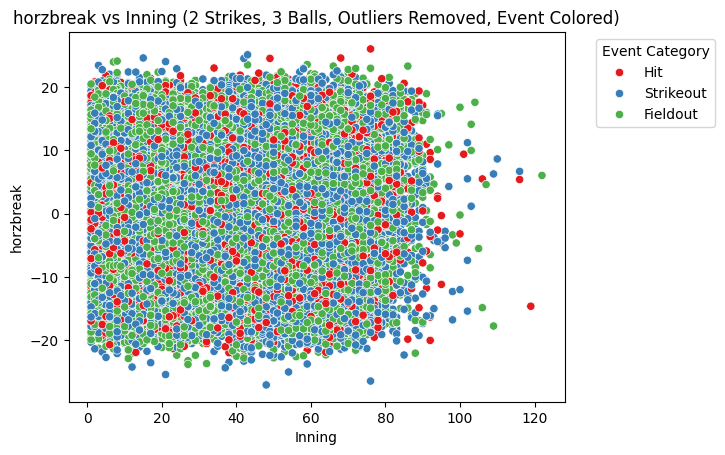

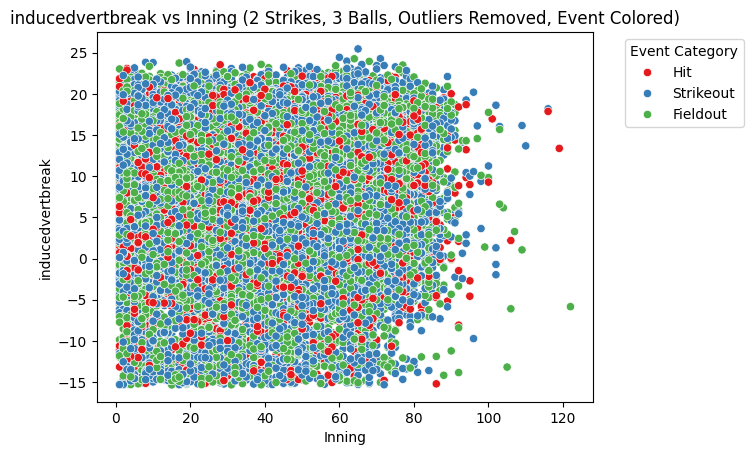

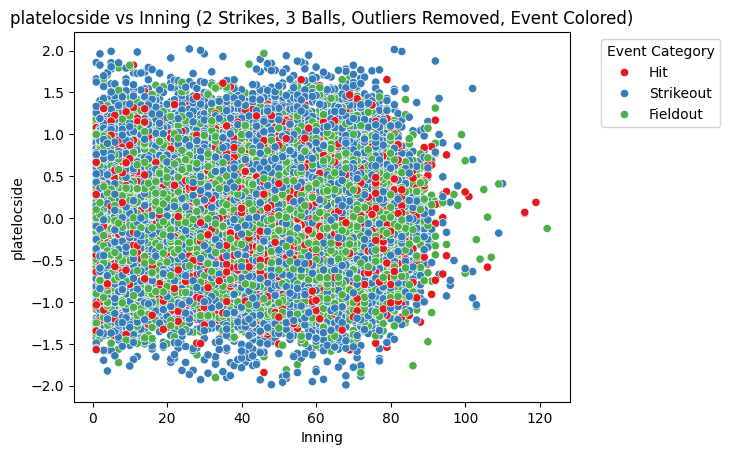

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data for rows where there are exactly 2 strikes and 3 balls
two_strike_three_ball_df = all_seasons[(all_seasons['strikes'] == 2) & (all_seasons['balls'] == 3)]

# Function to remove outliers using the IQR method
def remove_outliers(df, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 - Q1
    # Filter for values within the lower and upper bounds
    df_outliers_removed = df[~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]
    return df_outliers_removed

# Remove outliers in the filtered DataFrame
two_strike_three_ball_df_cleaned = remove_outliers(two_strike_three_ball_df, ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside'])

# Add a new column that categorizes the event types into different groups
def categorize_event(event):
    if event in strikeout_events:
        return 'Strikeout'
    elif event in fieldout_events:
        return 'Fieldout'
    elif event in hit:
        return 'Hit'

two_strike_three_ball_df_cleaned['event_category'] = two_strike_three_ball_df_cleaned['eventtype'].apply(categorize_event)

# Set the range of innings for the x-axis
inning_min = int(two_strike_three_ball_df_cleaned['ab'].min())
inning_max = int(two_strike_three_ball_df_cleaned['ab'].max())
inning_range = list(range(inning_min, inning_max + 1))

# List of features to plot against innings
features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside']

# Loop through the features and create individual plots for 2-strike, 3-ball counts without outliers, with different colors for event types
for i, feature in enumerate(features):
    plt.figure(i)  # Create a new figure for each feature
    sns.scatterplot(x='ab', y=feature, hue='event_category', palette='Set1', data=two_strike_three_ball_df_cleaned)
    
    # Set the x-axis ticks to go by 1 inning
    
    # Add titles and labels
    plt.title(f'{feature} vs Inning (2 Strikes, 3 Balls, Outliers Removed, Event Colored)')
    plt.xlabel('Inning')
    plt.ylabel(feature)
    
    # Show the plot
    plt.legend(title='Event Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()


/var/folders/20/qddrh_4x19s0st17k9zrxd2m0000gn/T/ipykernel_33282/3680763928.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  two_strike_three_ball_df_cleaned['event_category'] = two_strike_three_ball_df_cleaned['eventtype'].apply(categorize_event)


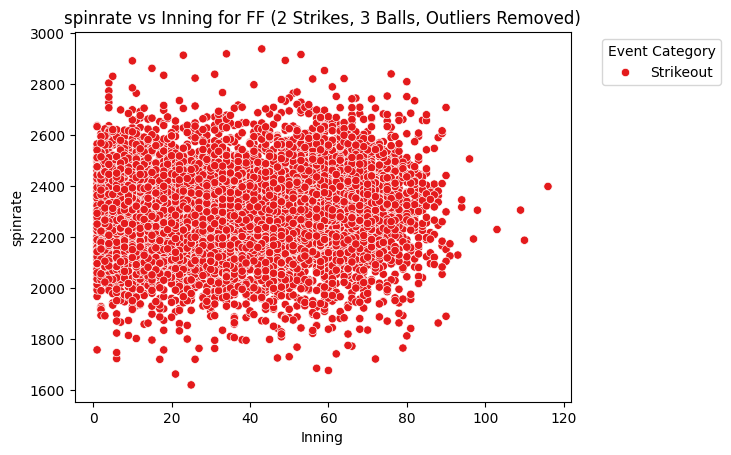

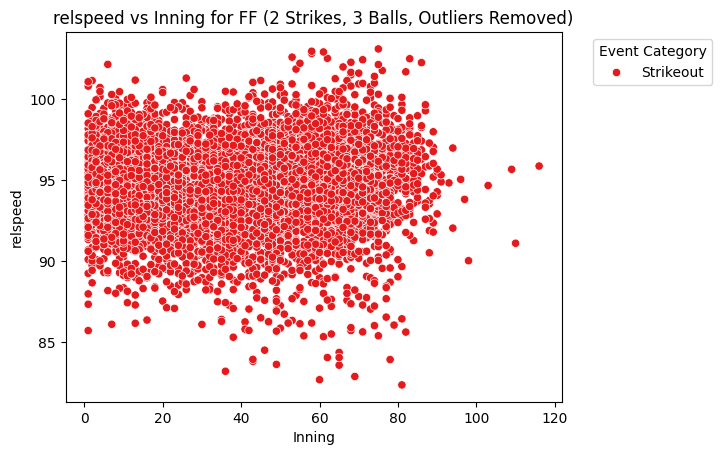

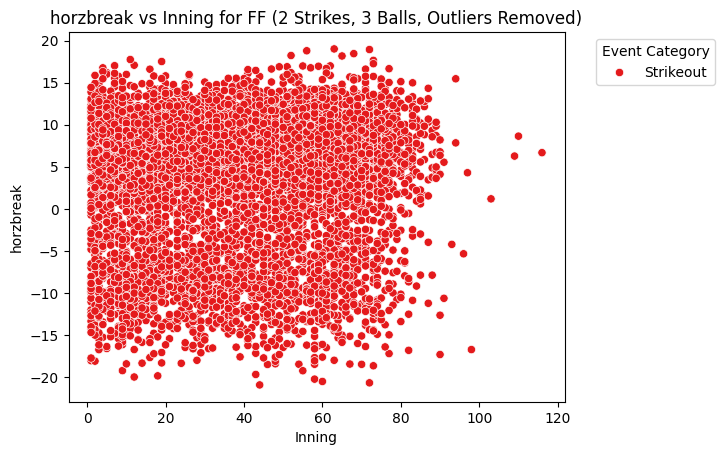

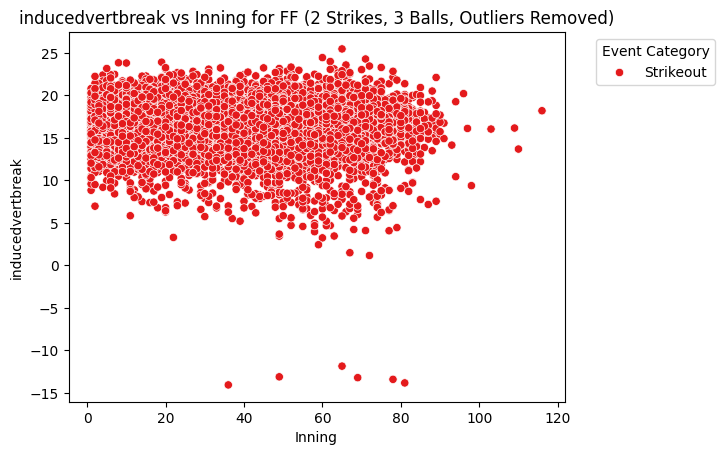

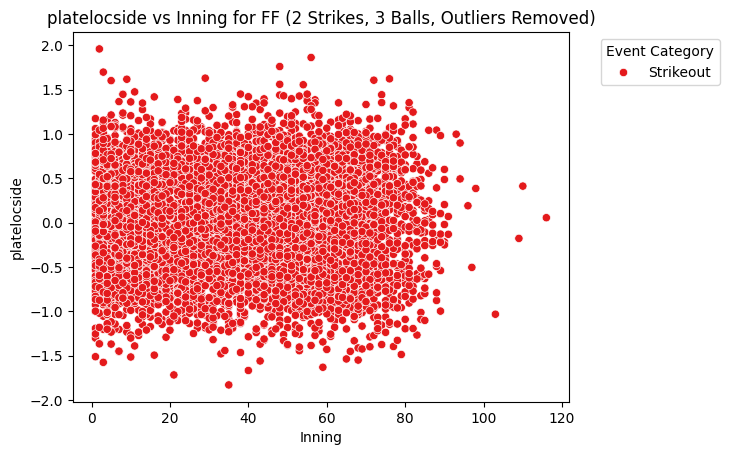

...

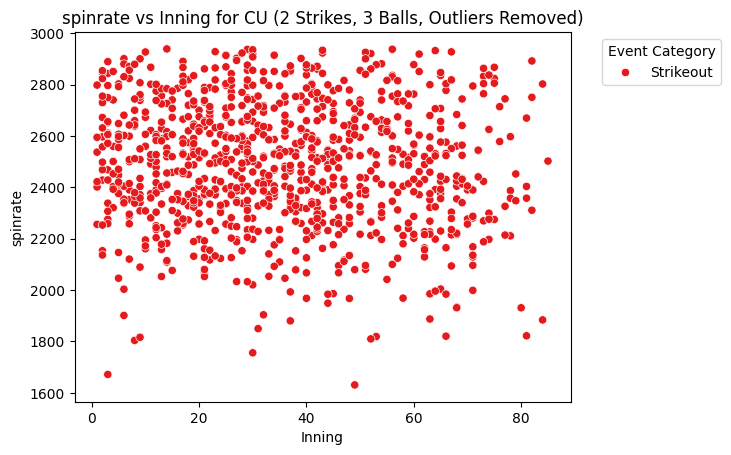

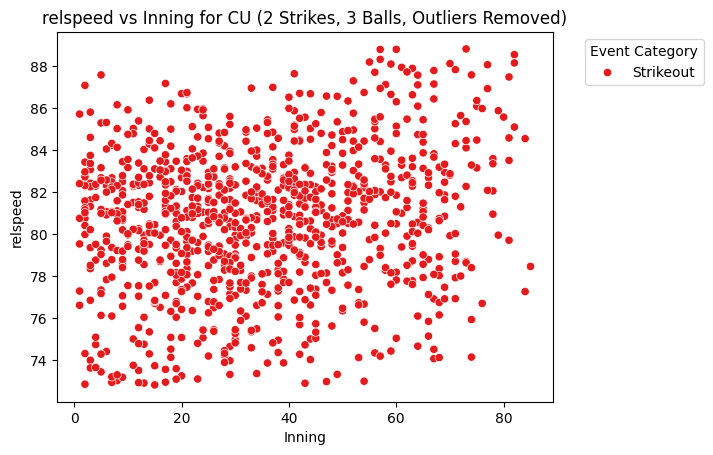

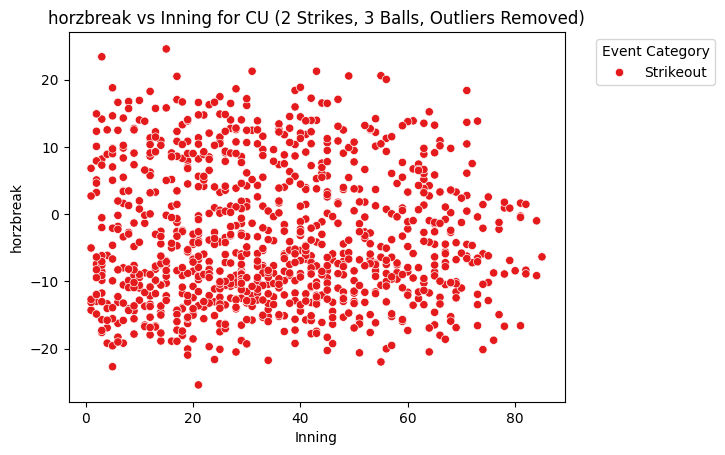

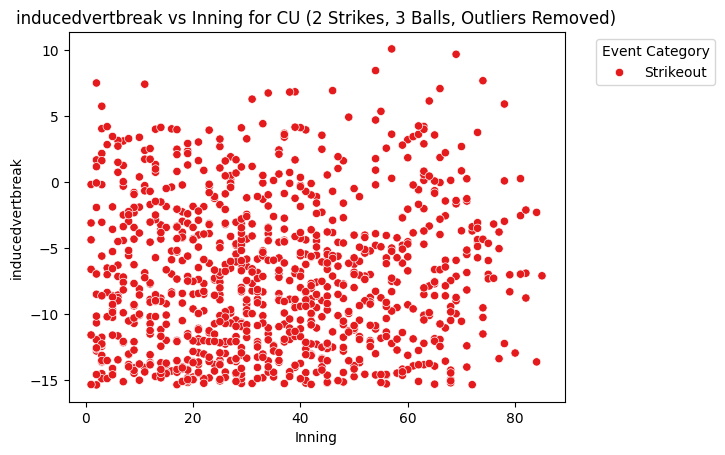

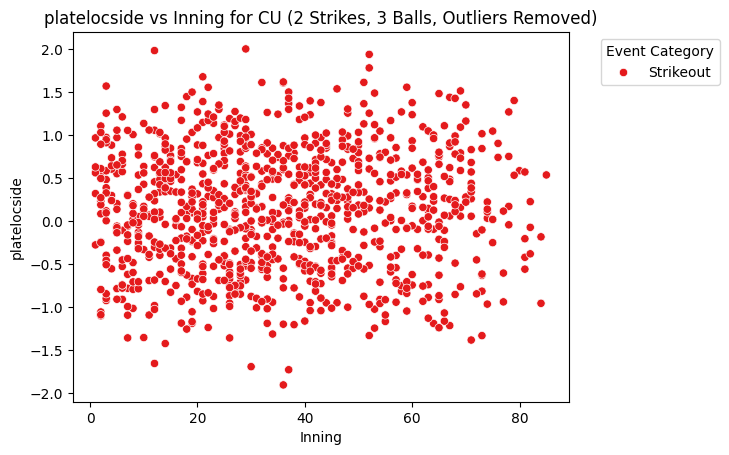

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data for rows where there are exactly 2 strikes and 3 balls
two_strike_three_ball_df = all_seasons[(all_seasons['strikes'] == 2) & (all_seasons['balls'] == 3)]

# Function to remove outliers using the IQR method
def remove_outliers(df, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 - Q1
    # Filter for values within the lower and upper bounds
    df_outliers_removed = df[~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]
    return df_outliers_removed

# Remove outliers in the filtered DataFrame
two_strike_three_ball_df_cleaned = remove_outliers(two_strike_three_ball_df, ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside'])

# Add a new column that categorizes the event types into different groups
def categorize_event(event):
    if event in strikeout_events:
        return 'Strikeout'
    #elif event in fieldout_events:
        return 'Fieldout'
    #elif event in hit:
        #return 'Hit'
    #else:
        #return 'Other'

two_strike_three_ball_df_cleaned['event_category'] = two_strike_three_ball_df_cleaned['eventtype'].apply(categorize_event)

# Get the unique pitch types
pitch_types = ['FF', 'SL', 'KC', 'CH', 'SI', 'FC', 'CU']

# List of features to plot against innings
features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside']

# Loop through each pitch type
for pitch_type in pitch_types:
    # Filter the data by pitch type
    pitch_df = two_strike_three_ball_df_cleaned[two_strike_three_ball_df_cleaned['pitchname'] == pitch_type]
    
    # Loop through the features and create individual plots for each pitch type
    for i, feature in enumerate(features):
        plt.figure(i)  # Create a new figure for each feature
        sns.scatterplot(x='ab', y=feature, hue='event_category', palette='Set1', data=pitch_df)
        
        # Add titles and labels
        plt.title(f'{feature} vs Inning for {pitch_type} (2 Strikes, 3 Balls, Outliers Removed)')
        plt.xlabel('Inning')
        plt.ylabel(feature)
        
        # Show the plot
        plt.legend(title='Event Category', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()


In [24]:
two_strike_three_ball_df_cleaned['pitchname'].unique()

array(['FF', 'SL', 'KC', 'CH', 'SI', 'FC', 'CU', 'FS', 'FA', 'FT', 'ST',
       'SV', 'FO', 'SC', 'KN'], dtype=object)

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix

# Filter for 2-strike counts and create a binary target (1 if strikeout, 0 if not)
df_filtered = all_seasons[all_seasons['strikes'] == 2]
df_filtered['is_strikeout'] = df_filtered['eventtype'].apply(lambda x: 1 if x in strikeout_events else 0)

# Define features and target variable
X = df_filtered[['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocheight']]
y = df_filtered['is_strikeout']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

from sklearn.impute import SimpleImputer

# Create an imputer object with a strategy of mean imputation
imputer = SimpleImputer(strategy='mean')

# Apply the imputer to the training data
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)  # Apply the same transformation to the test set

# Fit logistic regression model
log_reg = LogisticRegression()
log_reg.fit(X_train_imputed, y_train)

# Predictions
y_pred = log_reg.predict(X_test_imputed)


# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'Confusion Matrix: \n{conf_matrix}')


/var/folders/20/qddrh_4x19s0st17k9zrxd2m0000gn/T/ipykernel_33282/3949717396.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['is_strikeout'] = df_filtered['eventtype'].apply(lambda x: 1 if x in strikeout_events else 0)


Accuracy: 0.8046079121941988
Confusion Matrix: 
[[153067      0]
 [ 37171      0]]


/opt/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [41]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.impute import SimpleImputer

# Step 1: Filter the data for 2-strike counts
df_filtered = all_seasons[all_seasons['strikes'] == 2]

# Step 2: Create binary target columns
# Fieldouts: 1 if fieldout event, 0 otherwise
df_filtered['is_fieldout'] = df_filtered['eventtype'].apply(lambda x: 1 if x in fieldout_events else 0)

# Strikeouts: 1 if strikeout event, 0 otherwise
df_filtered['is_strikeout'] = df_filtered['eventtype'].apply(lambda x: 1 if x in strikeout_events else 0)

# Step 3: Define features (the same for both models)
features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside']

# Handle missing values (impute with mean)
imputer = SimpleImputer(strategy='mean')
X = df_filtered[features]
X_imputed = imputer.fit_transform(X)

# Step 4: Logistic regression for fieldouts
y_fieldout = df_filtered['is_fieldout']
X_train_fieldout, X_test_fieldout, y_train_fieldout, y_test_fieldout = train_test_split(X_imputed, y_fieldout, test_size=0.3, random_state=42)

log_reg_fieldout = LogisticRegression(class_weight='balanced')
log_reg_fieldout.fit(X_train_fieldout, y_train_fieldout)

# Predictions for fieldouts
y_pred_fieldout = log_reg_fieldout.predict(X_test_fieldout)
accuracy_fieldout = accuracy_score(y_test_fieldout, y_pred_fieldout)
conf_matrix_fieldout = confusion_matrix(y_test_fieldout, y_pred_fieldout)

print(f'Fieldout Model - Accuracy: {accuracy_fieldout}')
print(f'Fieldout Model - Confusion Matrix: \n{conf_matrix_fieldout}')


# Step 5: Logistic regression for strikeouts
y_strikeout = df_filtered['is_strikeout']
X_train_strikeout, X_test_strikeout, y_train_strikeout, y_test_strikeout = train_test_split(X_imputed, y_strikeout, test_size=0.3, random_state=42)

log_reg_strikeout = LogisticRegression(class_weight='balanced')
log_reg_strikeout.fit(X_train_strikeout, y_train_strikeout)

# Predictions for strikeouts
y_pred_strikeout = log_reg_strikeout.predict(X_test_strikeout)
accuracy_strikeout = accuracy_score(y_test_strikeout, y_pred_strikeout)
conf_matrix_strikeout = confusion_matrix(y_test_strikeout, y_pred_strikeout)

print(f'Strikeout Model - Accuracy: {accuracy_strikeout}')
print(f'Strikeout Model - Confusion Matrix: \n{conf_matrix_strikeout}')


/var/folders/20/qddrh_4x19s0st17k9zrxd2m0000gn/T/ipykernel_33282/4157664174.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['is_fieldout'] = df_filtered['eventtype'].apply(lambda x: 1 if x in fieldout_events else 0)
/var/folders/20/qddrh_4x19s0st17k9zrxd2m0000gn/T/ipykernel_33282/4157664174.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['is_strikeout'] = df_filtered['eventtype'].apply(lambda x: 1 if x in strikeout_events else 0)
/opt/miniconda3/lib/python3.12/site-packages

Fieldout Model - Accuracy: 0.5265088993786731
Fieldout Model - Confusion Matrix: 
[[85610 75999]
 [14077 14552]]
Strikeout Model - Accuracy: 0.5549679874683291
Strikeout Model - Confusion Matrix: 
[[88424 64643]
 [20019 17152]]


In [57]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.impute import SimpleImputer

# Step 1: Filter the data for 2-strike counts
df_filtered = all_seasons[(all_seasons['strikes'] == 2) &  (all_seasons['balls'] == 3)]

# Step 2: Create binary target column where strikeouts = 1 and fieldouts = 0
df_filtered['strikeout_vs_fieldout'] = df_filtered['eventtype'].apply(lambda x: 1 if x in strikeout_events else (0 if x in fieldout_events else None))

# Remove rows where the target column is None (i.e., events that are neither strikeouts nor fieldouts)
df_filtered = df_filtered.dropna(subset=['strikeout_vs_fieldout'])

# Step 3: Define features and handle missing values
features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside','platelocheight']

# Handle missing values (impute with mean)
imputer = SimpleImputer(strategy='mean')
X = df_filtered[features]
X_imputed = imputer.fit_transform(X)

# Target variable: strikeout = 1, fieldout = 0
y = df_filtered['strikeout_vs_fieldout']

# Step 4: Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Step 5: Fit logistic regression model
log_reg = LogisticRegression(class_weight='balanced')  # Add class_weight to handle imbalance
log_reg.fit(X_train, y_train)

# Step 6: Predictions
y_pred = log_reg.predict(X_test)

# Step 7: Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'Confusion Matrix: \n{conf_matrix}')


Accuracy: 0.5550173569064342
Confusion Matrix: 
[[3422 2558]
 [2954 3453]]


/var/folders/20/qddrh_4x19s0st17k9zrxd2m0000gn/T/ipykernel_33282/4025920070.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['strikeout_vs_fieldout'] = df_filtered['eventtype'].apply(lambda x: 1 if x in strikeout_events else (0 if x in fieldout_events else None))
/opt/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regressi

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.impute import SimpleImputer

# Step 1: Filter the data for 2-strike counts
df_filtered = all_seasons[(all_seasons['strikes'] == 2) &  (all_seasons['balls'] == 3)]

# Step 2: Create binary target column where strikeouts = 1 and fieldouts = 0
df_filtered['strikeout_vs_fieldout'] = df_filtered['eventtype'].apply(lambda x: 1 if x in strikeout_events else (0 if x in complements else None))

# Remove rows where the target column is None (i.e., events that are neither strikeouts nor fieldouts)
df_filtered = df_filtered.dropna(subset=['strikeout_vs_fieldout'])

# Step 3: Define features and handle missing values
features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside','platelocheight']

# Handle missing values (impute with mean)
imputer = SimpleImputer(strategy='mean')
X = df_filtered[features]
X_imputed = imputer.fit_transform(X)

# Target variable: strikeout = 1, fieldout = 0
y = df_filtered['strikeout_vs_fieldout']

# Step 4: Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Step 5: Fit logistic regression model
log_reg = LogisticRegression(class_weight='balanced')  # Add class_weight to handle imbalance
log_reg.fit(X_train, y_train)

# Step 6: Predictions
y_pred = log_reg.predict(X_test)

# Step 7: Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'Confusion Matrix: \n{conf_matrix}')
